In [1]:
!pip install pretty_midi
!pip install mir_eval
!pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: C:\Users\antho\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: C:\Users\antho\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: C:\Users\antho\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [7]:
import pretty_midi
import IPython.display

file_path = 'example.mid' 
midi_data = pretty_midi.PrettyMIDI(file_path)
audio_data = midi_data.synthesize(fs=16000)
IPython.display.Audio(audio_data, rate=16000)

In [9]:
file_path = 'example.mid' 
midi_data = pretty_midi.PrettyMIDI(file_path)

duration = midi_data.get_end_time()
print("----------- [곡 길이] -----------")
print(f"총 재생 시간: {duration:.2f}초 ({int(duration // 60)}분 {int(duration % 60)}초)")
print("-" * 35, "\n")

print("----------- [PPQN] -----------")
resolution = midi_data.resolution
print(f"PPQN: {resolution} Ticks/Pulses per quarter note")
print("-" * 35, "\n")

print("----------- [템포 정보] -----------")
print("곡의 전체 템포(분당 박자 수) 추정값:", midi_data.estimate_tempo())
tempos = midi_data.get_tempo_changes()
# print(tempos)
if len(tempos[1]) == 1:
    print(f"곡의 전체 템포: {int(tempos[1][0])} BPM")
else:
    print(f"템포 변경 횟수: {len(tempos[1])}번")
    for i in range(10):
        print(f"  - {i+1}번째 템포: {int(tempos[1][i])} BPM")
print("-" * 35, "\n")

print("----------- [박자 정보] -----------")
ts_changes = midi_data.time_signature_changes 

# 기본값을 4/4로 설정하고, 정보가 있으면 갱신
ts_1, ts_2 = 4, 4
if len(ts_changes) == 1:
    ts_1 = ts_changes[0].numerator
    ts_2 = ts_changes[0].denominator
    print(f"곡의 전체 박자: {ts_1}/{ts_2}")
else:
    print(f"박자 변경 횟수 (Time Signature Changes): {len(ts_changes)}번")
    for i in range(len(ts_changes)):
        print(f"  - {i+1}번째 박자: {ts_changes[i].numerator}/{ts_changes[i].denominator}")
print("-" * 35, "\n")

print("----------- [악기 정보] -----------")
for i in range(len(midi_data.instruments)):
    print(midi_data.instruments[i])


----------- [곡 길이] -----------
총 재생 시간: 367.10초 (6분 7초)
----------------------------------- 

----------- [PPQN] -----------
PPQN: 384 Ticks/Pulses per quarter note
----------------------------------- 

----------- [템포 정보] -----------
곡의 전체 템포(분당 박자 수) 추정값: 192.47662739311755
템포 변경 횟수: 54번
  - 1번째 템포: 199 BPM
  - 2번째 템포: 99 BPM
  - 3번째 템포: 199 BPM
  - 4번째 템포: 120 BPM
  - 5번째 템포: 208 BPM
  - 6번째 템포: 36 BPM
  - 7번째 템포: 210 BPM
  - 8번째 템포: 90 BPM
  - 9번째 템포: 210 BPM
  - 10번째 템포: 212 BPM
----------------------------------- 

----------- [박자 정보] -----------
박자 변경 횟수 (Time Signature Changes): 3번
  - 1번째 박자: 2/4
  - 2번째 박자: 8/4
  - 3번째 박자: 2/4
----------------------------------- 

----------- [악기 정보] -----------
Instrument(program=73, is_drum=False, name="FLUTE")
Instrument(program=68, is_drum=False, name="OBOE")
Instrument(program=71, is_drum=False, name="CLARINET")
Instrument(program=70, is_drum=False, name="BASSOON")
Instrument(program=60, is_drum=False, name="FR.HORN")
Instrument(program=

In [4]:
print(f"총 악기(트랙) 수: {len(midi_data.instruments)}개")
for i, instrument in enumerate(midi_data.instruments):
    instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
    print(f"  - 트랙 {i}: {instrument_name} (음표 수: {len(instrument.notes)}개)")
print("-" * 35, "\n")

총 악기(트랙) 수: 11개
  - 트랙 0: Flute (음표 수: 1075개)
  - 트랙 1: Oboe (음표 수: 1015개)
  - 트랙 2: Clarinet (음표 수: 1219개)
  - 트랙 3: Bassoon (음표 수: 1293개)
  - 트랙 4: French Horn (음표 수: 818개)
  - 트랙 5: Trumpet (음표 수: 534개)
  - 트랙 6: Timpani (음표 수: 369개)
  - 트랙 7: String Ensemble 1 (음표 수: 2798개)
  - 트랙 8: String Ensemble 1 (음표 수: 1264개)
  - 트랙 9: String Ensemble 1 (음표 수: 878개)
  - 트랙 10: Contrabass (음표 수: 765개)
----------------------------------- 



In [5]:
# 확인할 악기 선택해서 MIDI Event의 네 가지 요소 확인
target_instrument = midi_data.instruments[9]

print("MIDI Events for Selected Instrument")
print(f"Channel specification: {pretty_midi.program_to_instrument_name(target_instrument.program)}")
print("-" * 55)
print("Note Number (Pitch) | Key Velocity | Timestamp")
print("---------------------------------------------------------")

for note in target_instrument.notes[:8]:
    print(f"{note.pitch:<16} | {note.velocity:<16} | {note.start:<18.3f}")


MIDI Events for Selected Instrument
Channel specification: String Ensemble 1
-------------------------------------------------------
Note Number (Pitch) | Key Velocity | Timestamp
---------------------------------------------------------
43               | 123              | 0.150             
43               | 123              | 0.300             
43               | 123              | 0.450             
39               | 123              | 0.600             
41               | 123              | 1.950             
41               | 123              | 2.100             
41               | 123              | 2.250             
38               | 123              | 2.400             


C:\Users\antho\AppData\Local\Temp\ipykernel_7340\1662373692.py:7: UserWarning: Frequency axis exceeds Nyquist. Did you remember to set all spectrogram parameters in specshow?
  librosa.display.specshow(piano_roll[start_pitch:end_pitch],


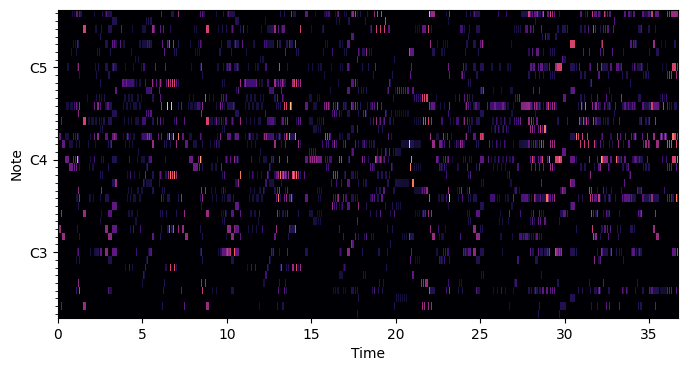

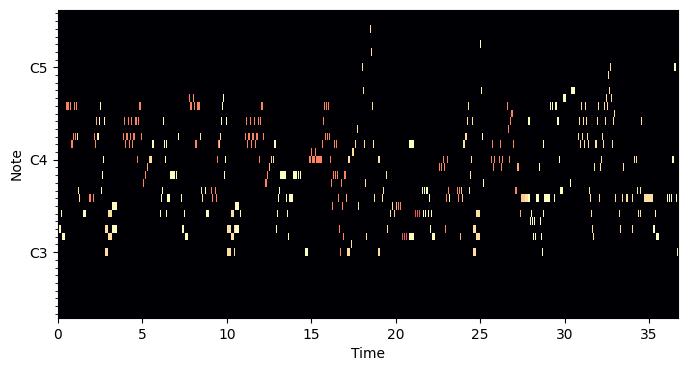

In [1]:
import pretty_midi
import matplotlib.pyplot as plt
import numpy as np
import librosa.display 

def plot_piano_roll(piano_roll, start_pitch, end_pitch, fs=100):
    librosa.display.specshow(piano_roll[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))
    
file_path = 'example.mid' 
midi_data = pretty_midi.PrettyMIDI(file_path)
fs = 10
start_pitch = 30
end_pitch = 70

full_piano_roll = midi_data.get_piano_roll(fs=fs)
strings = midi_data.instruments[8]
string_roll = strings.get_piano_roll(fs=fs)

plt.figure(figsize=(8, 4))
plot_piano_roll(full_piano_roll, 40, 80)

plt.figure(figsize=(8, 4))
plot_piano_roll(string_roll, 40, 80)

### 그 외 이용 사례 - Analyzing the MIDI data

Text(0, 0.5, 'Tempo')

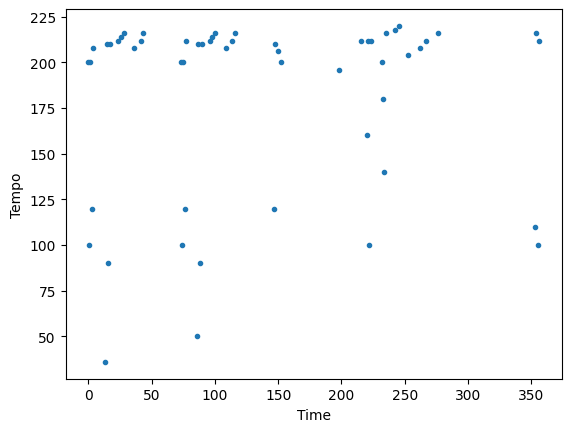

In [7]:
import pretty_midi
import matplotlib.pyplot as plt

file_path = 'example.mid' 
midi_data = pretty_midi.PrettyMIDI(file_path)
times, tempo_changes = midi_data.get_tempo_changes()
plt.plot(times, tempo_changes, '.')
plt.xlabel('Time')
plt.ylabel('Tempo')

Text(0, 0.5, 'Proportion')

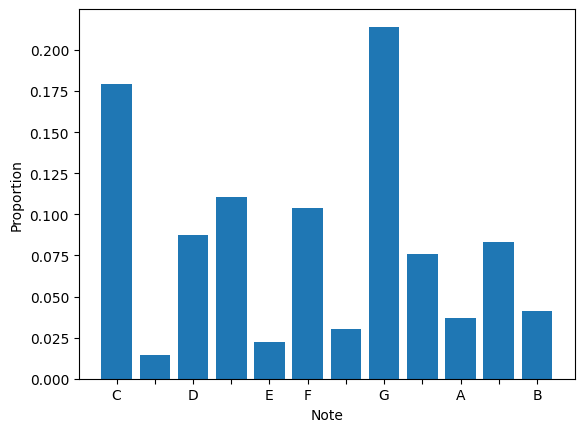

In [11]:
plt.bar(np.arange(12), midi_data.get_pitch_class_histogram());
plt.xticks(np.arange(12), ['C', '', 'D', '', 'E', 'F', '', 'G', '', 'A', '', 'B'])
plt.xlabel('Note')
plt.ylabel('Proportion')

In [12]:
# Count the number of transitions from C to D in this song
n_c_to_d = 0
for instrument in midi_data.instruments:
    # Drum instrument notes don't have pitches!
    if instrument.is_drum:
        continue
    for first_note, second_note in zip(instrument.notes[:-1], instrument.notes[1:]):
        n_c_to_d += (first_note.pitch % 12 == 0) and (second_note.pitch % 12 == 2)
print('{} C-to-D transitions.'.format(n_c_to_d))

124 C-to-D transitions.
